In [3]:
%matplotlib notebook 

import os 
import yaml
from argparse import Namespace


import torch
import numpy as np
import matplotlib.pyplot as plt

import sys
sys.path.append('../src/models/')
import network_light as nl
import s_parser as sp
import dataloaders as dl

# from dataloaders import senseiver_dataloader


from importlib import reload

In [12]:
# Specify the path to your YAML file
yaml_file_path = "../src/models/wandb/run-20240811_010147-t0ofz8t4/files/config.yaml"

# Open the YAML file and load its contents
with open(yaml_file_path, "r") as yaml_file:
    config = yaml.safe_load(yaml_file)

for key,val in config.items():
    try:
        config[key] = config[key]['value']
    except:
        continue
args = Namespace(**config)
data_config, encoder_config, decoder_config = sp.assign_args(args)

In [15]:
print(decoder_config)

{'dec_preproc_ch': 64, 'dec_num_latent_channels': 16, 'latent_size': 1, 'dec_num_cross_attention_heads': 1}


In [11]:
reload(nl)

model_id = '4jeen4w2'
epoch = 359
path_to_checkpoint = f'/Users/z6f/code/ehr-env/src/models/pollution/{model_id}/checkpoints/train-epoch={epoch}.ckpt'
model = nl.Senseiver.load_from_checkpoint(path_to_checkpoint)
/Users/joa/Desktop/pm-modeling/src/models/pollution/t0ofz8t4/checkpoints/train-epoch=609.ckpt

"accelerator":                         mps
"accum_grads":                         1
"batch_size":                          16
"data_path":                           ../../data/processed/processed_pm25_gridmet_None.parquet
"dec_num_cross_attention_heads":       1
"dec_num_latent_channels":             16
"dec_preproc_ch":                      64
"dropout":                             0.0
"enc_num_latent_channels":             16
"enc_num_self_attention_heads":        2
"enc_preproc_ch":                      128
"gpu_device":                          [0]
"im_ch":                               22
"latent_size":                         1
"load_model_num":                      None
"locality":                            0.05
"lr":                                  0.0001
"nlags":                               15
"num_cross_attention_heads":           2
"num_latents":                         256
"num_layers":                          3
"num_queries":                         1
"num_self_attent

results senseiver: 
R^2: 0.6142077304600941
MAE: 1.996073603630066
RMSE: 3.077108383178711
results average: 
R^2: 0.6612996539918614
MAE: 1.8209238038484863
RMSE: 2.883193867486586


<IPython.core.display.Javascript object>


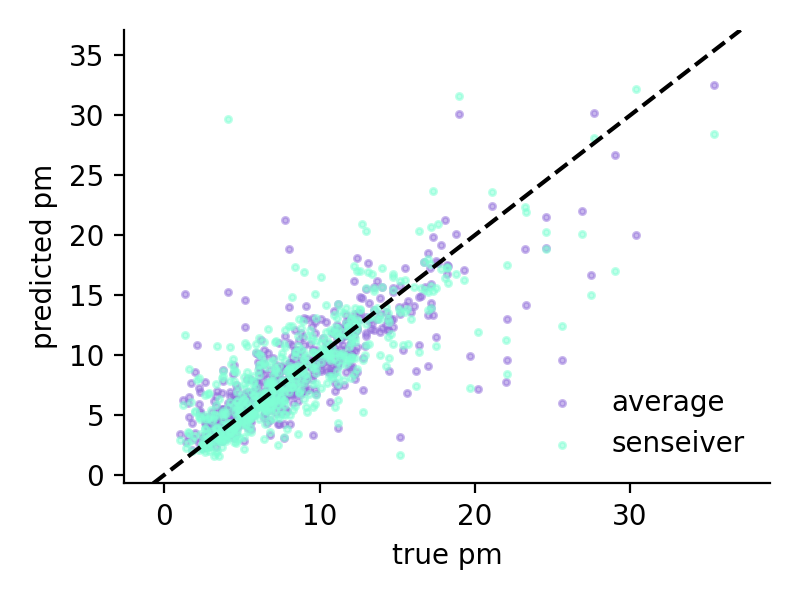

In [19]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
reload(dl)
data_config['data_path'] = '../data/processed/processed_pm25_gridmet_2013.parquet'
data_config['split_path'] = '../data/processed/split_h3.csv'
torch.manual_seed(2)
dataloader = dl.senseiver_dataloader(data_config, num_workers=1,
                                     validation=True)
sensors, query_coords, targets = dataloader.dataset[0]
model(sensors.to('mps').unsqueeze(0),query_coords.to('mps').unsqueeze(0))


all_pred = []
all_targ = []
sensor_means = []
#all_positions = np.array([[0,0,0]])
#for i in range(0,50000,100):
for i in range(0,6832,12):

    with torch.no_grad():
        sensors, query_coords, targets = dataloader.dataset[i]
        query_coords = query_coords[0,:].unsqueeze(0)
        targets = targets[0,:]
        sensor_means+=[sensors[:,0].mean().detach().item()]
        out = model(sensors.to('mps').unsqueeze(0),query_coords.to('mps').unsqueeze(0))
        all_pred += list(out.detach().cpu().numpy().ravel())
        # all_pred += list(out.detach().cpu().numpy().ravel() + sensors[:,0].mean().detach().item())

        # all_targ += list(targets.reshape(2,1).numpy().ravel())
        all_targ += list(targets.numpy().ravel())


all_targ = np.array(all_targ)
all_pred = np.array(all_pred)
sensor_means = np.array(sensor_means)

print('results senseiver: ')
print('R^2: {0}'.format(r2_score(10**all_targ,10**all_pred)))
print('MAE: {0}'.format(mean_absolute_error(10**all_targ,10**all_pred)))
print('RMSE: {0}'.format(np.sqrt(mean_squared_error(10**all_targ,10**all_pred))))

print('results average: ')
print('R^2: {0}'.format(r2_score(10**all_targ,10**sensor_means)))
print('MAE: {0}'.format(mean_absolute_error(10**all_targ,10**sensor_means)))
print('RMSE: {0}'.format(np.sqrt(mean_squared_error(10**all_targ,10**sensor_means))))

f,ax = plt.subplots(figsize=(4,3))
ax.scatter(10**all_targ,10**sensor_means, s=5, alpha=.5, c='mediumpurple')

ax.scatter(10**all_targ,10**all_pred, s=5, alpha=.5, c='aquamarine')
ax.set_ylim(ax.get_xlim())
ax.plot(ax.get_xlim(),ax.get_xlim(),'k--')
ax.set_xlabel('true pm')
ax.set_ylabel('predicted pm')
ax.legend(['average','senseiver'],frameon=False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
f.tight_layout()

In [26]:
reload(dl)
years = np.arange(2002,2007)
for year in years :
    print(f"Validating for year: {year}")
    data_config['data_path'] = f'../data/processed/processed_pm25_gridmet_{year}.parquet'
    data_config['split_path'] = '../data/processed/split_h3.csv'
    torch.manual_seed(2)
    dataloader = dl.senseiver_dataloader(data_config, num_workers=1,
                                         mode='test')
    sensors, query_coords, targets = dataloader.dataset[0]
    model(sensors.to('mps').unsqueeze(0),query_coords.to('mps').unsqueeze(0))

    print(len(dataloader.dataset))
    all_pred = []
    all_targ = []
    sensor_means = []
    #all_positions = np.array([[0,0,0]])
    #for i in range(0,50000,100):
    for i in range(len(dataloader.dataset)):

        with torch.no_grad():
            sensors, query_coords, targets = dataloader.dataset[i]
            query_coords = query_coords[0,:].unsqueeze(0)
            targets = targets[0,:]
            sensor_means+=[sensors[:,0].mean().detach().item()]
            out = model(sensors.to('mps').unsqueeze(0),query_coords.to('mps').unsqueeze(0))
            all_pred += list(out.detach().cpu().numpy().ravel())
            # all_pred += list(out.detach().cpu().numpy().ravel() + sensors[:,0].mean().detach().item())

            # all_targ += list(targets.reshape(2,1).numpy().ravel())
            all_targ += list(targets.numpy().ravel())


    all_targ = np.array(all_targ)
    all_pred = np.array(all_pred)
    sensor_means = np.array(sensor_means)

    print('results senseiver: ')
    print('R^2: {0}'.format(r2_score(10**all_targ,10**all_pred)))
    print('MAE: {0}'.format(mean_absolute_error(10**all_targ,10**all_pred)))
    print('RMSE: {0}'.format(np.sqrt(mean_squared_error(10**all_targ,10**all_pred))))

    print('results average: ')
    print('R^2: {0}'.format(r2_score(10**all_targ,10**sensor_means)))
    print('MAE: {0}'.format(mean_absolute_error(10**all_targ,10**sensor_means)))
    print('RMSE: {0}'.format(np.sqrt(mean_squared_error(10**all_targ,10**sensor_means))))


Validating for year: 2002
16739
results senseiver: 
R^2: 0.5162670318882657
MAE: 3.846539258956909
RMSE: 6.924295425415039
results average: 
R^2: 0.5775355607761619
MAE: 3.0457423525532046
RMSE: 6.47094690456787
Validating for year: 2003
14038
results senseiver: 
R^2: 0.49345727739354384
MAE: 3.7065327167510986
RMSE: 5.961003303527832
results average: 
R^2: 0.6268687450399366
MAE: 2.8098661035916486
RMSE: 5.116136771218858
Validating for year: 2004
14070
results senseiver: 
R^2: 0.47319409848617344
MAE: 3.583414077758789
RMSE: 5.7837233543396
results average: 
R^2: 0.6503297163098063
MAE: 2.599391877436983
RMSE: 4.712068374059153
Validating for year: 2005
13842
results senseiver: 
R^2: 0.55493661609766
MAE: 3.8576738834381104
RMSE: 6.251591682434082
results average: 
R^2: 0.6405684624762062
MAE: 2.894493418645082
RMSE: 5.618077947288455
Validating for year: 2006
13562
results senseiver: 
R^2: 0.48106161462957053
MAE: 3.5991508960723877
RMSE: 5.673708915710449
results average: 
R^2: 0.6

In [39]:
len(dataloader.dataset.times)

6832

In [ ]:
results senseiver: 
R^2: 0.466835807676797
MAE: 4.309004783630371
RMSE: 7.044290542602539
results average: 
R^2: 0.24291408294912176
MAE: 5.169097908760122
RMSE: 8.394201073560394

In [27]:
import pandas as pd
data = pd.read_csv(data_config['data_path'])

In [28]:
split = pd.read_csv(data_config['split_path'])

In [30]:
split.groupby('Split').count()

,id,Site,h3_08,h3
Split,,,,
test,390104,390104,390104,390104
train,3514655,3514655,3514655,3514655
val,421293,421293,421293,421293


In [2]:
#Added:
import polars as pl
import torch
from valid_utils import get_latest_config, load_model, run_test
from importlib import reload

args, data_config, encoder_config, decoder_config = get_latest_config()

data_config['sensor_data_path'] = '/Users/joa/Desktop/pm-modeling/data/processed/processed_pmgrid.parquet'
data_config['query_data_path'] = '/Users/joa/Desktop/pm-modeling/data/processed/processed_hexes.parquet'
print("Data Config:", data_config)

# Load model
model_id = "t0ofz8t4"
epoch = "609"
model = load_model(model_id, epoch)

# Run the test and print results
pm = run_test(model, data_config, num_samples=100000)
print(pm.head())



pm.to_csv('pm2.csv', index=False)
print("Results saved to pm2.csv")


Data Config: {'data_path': '../../data/processed/processed_pm25_gridmet_None.parquet', 'split_path': '../../data/processed/split_h3.csv', 'split': 'train', 'num_sensors': 32, 'num_queries': 1, 'gpu_device': [[0]], 'accelerator': 'mps', 'seed': 123, 'lr': 0.0001, 'batch_size': 16, 'accum_grads': 1, 'test': False, 'space_bands': 32, 'locality': 0.05, 'nlags': 15, 'sensor_data_path': '/Users/joa/Desktop/pm-modeling/data/processed/processed_pmgrid.parquet', 'query_data_path': '/Users/joa/Desktop/pm-modeling/data/processed/processed_hexes.parquet'}
"accelerator":                         mps
"accum_grads":                         1
"batch_size":                          16
"data_path":                           ../../data/processed/processed_pm25_gridmet_None.parquet
"dec_num_cross_attention_heads":       1
"dec_num_latent_channels":             16
"dec_preproc_ch":                      64
"dropout":                             0.0
"enc_num_latent_channels":             16
"enc_num_self_atte

In [4]:
import polars as pl
import pandas as pd
import torch
from valid_utils import get_latest_config, load_model, run_test_in_chunks
from importlib import reload

args, data_config, encoder_config, decoder_config = get_latest_config()

data_config['sensor_data_path'] = '/Users/joa/Desktop/pm-modeling/data/processed/processed_pmgrid.parquet'
data_config['query_data_path'] = '/Users/joa/Desktop/pm-modeling/data/processed/processed_hexes.parquet'
print("Data Config:", data_config)

# Load model
model_id = "t0ofz8t4"
epoch = "609"
model = load_model(model_id, epoch)

# Run the test in chunks and combine results
run_test_in_chunks(model, data_config, chunk_size=100000)

# Load and display the combined results
combined_results = pd.read_csv('combined_hex_pred.csv')
print(combined_results.head())

print("Results saved to combined_hex_pred.csv")


Data Config: {'data_path': '../../data/processed/processed_pm25_gridmet_None.parquet', 'split_path': '../../data/processed/split_h3.csv', 'split': 'train', 'num_sensors': 32, 'num_queries': 1, 'gpu_device': [[0]], 'accelerator': 'mps', 'seed': 123, 'lr': 0.0001, 'batch_size': 16, 'accum_grads': 1, 'test': False, 'space_bands': 32, 'locality': 0.05, 'nlags': 15, 'sensor_data_path': '/Users/joa/Desktop/pm-modeling/data/processed/processed_pmgrid.parquet', 'query_data_path': '/Users/joa/Desktop/pm-modeling/data/processed/processed_hexes.parquet'}
"accelerator":                         mps
"accum_grads":                         1
"batch_size":                          16
"data_path":                           ../../data/processed/processed_pm25_gridmet_None.parquet
"dec_num_cross_attention_heads":       1
"dec_num_latent_channels":             16
"dec_preproc_ch":                      64
"dropout":                             0.0
"enc_num_latent_channels":             16
"enc_num_self_atte

/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 1900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 2900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 3900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 4900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 5900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 6900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 7900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 8900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9400000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9500000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9600000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9700000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9800000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 9900000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 10000000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 10100000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 10200000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 10300000
Total predictions: 100000
Total sensor means: 100000
Query data chunk shape: (100000, 12)
Predictions length: 100000
Sensor means length: 100000


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


Processing chunk starting at index 10400000
Total predictions: 45921
Total sensor means: 45921
Query data chunk shape: (45921, 12)
Predictions length: 45921
Sensor means length: 45921


/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'predictions'] = predictions
/Users/joa/Desktop/pm-modeling/notebooks/../src/models/valid_utils.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  query_data_chunk.loc[:, 'sensor_means'] = sensor_means


All chunks combined into combined_hex_pred
   Column1  max_air_temperature_value  precipitation_amount_value       lat  \
0        0                   0.373272                         0.0  0.715559   
1        1                   0.271889                         0.0  0.767572   
2        2                   0.474654                         0.0  0.756126   
3        3                   0.366359                         0.0  0.732136   
4        4                   0.373272                         0.0  0.729913   

   wind_speed_value            h3_08  min_air_temperature_value  \
0          0.145299  8828130db1fffff                   0.394191   
1          0.051282  8828a8170dfffff                   0.307054   
2          0.196581  88281a8d57fffff                   0.514523   
3          0.170940  8828ad8059fffff                   0.390041   
4          0.170940  8828ad91a3fffff                   0.390041   

   min_relative_humidity_value       lon  max_relative_humidity_value  \
0     